# Gmidi Use Example

In [2]:
import gmidi 
from gmidi import Gmidi
from gmidi.midiarray import MidiArray
#______________________________

import midi
import numpy as np
import fluidsynth
import matplotlib.pyplot as plt
import mir_eval.display
import librosa.display
import json

import IPython.display

## Creating gmidi

You may create a gmidi file by giving as a parameter an instance of any midi representation or a string with a path to a midi file.

In [4]:
path = "samples/"

In [6]:
#importing
m = Gmidi(path+"midifile.mid")

ValueError: If src is a path it should point to a file

In [4]:
#exporting to midifile
m.to(path+"newmidifile.mid")

'samples/newmidifile.mid.mid'

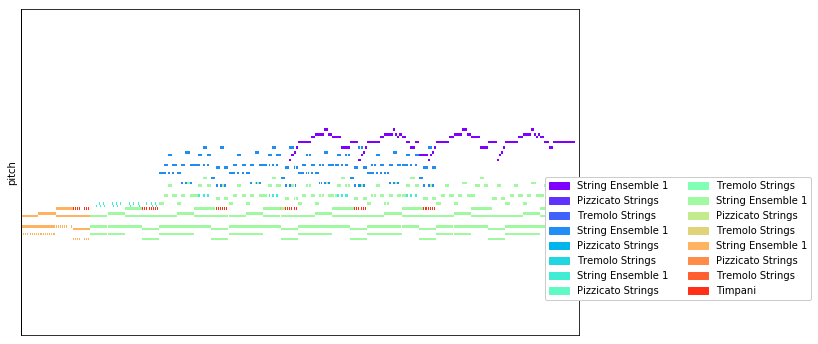

In [5]:
#exporting to jpg
m.to_jpg(path+"midifile.jpg")

In [6]:
#exporting to gif
m.to_gif(path+"midifile.gif")


[MoviePy] Building file samples/midifile.gif with imageio


 99%|█████████▉| 80/81 [00:59<00:00,  1.35it/s]


In [1]:
#exporting to wav
m.to_wav(path+"midifile.wav")

NameError: name 'm' is not defined

### As a Midi Pattern

In [3]:
m = Gmidi(path+"midifile.mid")
track = midi.Track()
m.append(track)
on = midi.NoteOnEvent(tick=0, velocity=100, pitch=midi.G_3)
track.append(on)
off = midi.NoteOffEvent(tick=100, pitch=midi.G_3)
track.append(off)
eot = midi.EndOfTrackEvent(tick=1)
track.append(eot)
print(m)
m.to(path+"newmidifile.mid")

Gmidi(<class 'midi.containers.Pattern'>,midi.Pattern(format=1, resolution=24, tracks=\
[midi.Track(\
  [midi.SetTempoEvent(tick=0, data=[9, 39, 191]),
   midi.TimeSignatureEvent(tick=0, data=[4, 2, 24, 8]),
   midi.KeySignatureEvent(tick=0, data=[6, 0]),
   midi.EndOfTrackEvent(tick=0, data=[])]),
 midi.Track(\
  [midi.ProgramChangeEvent(tick=0, channel=0, data=[48]),
   midi.ControlChangeEvent(tick=0, channel=0, data=[7, 100]),
   midi.ControlChangeEvent(tick=0, channel=0, data=[10, 64]),
   midi.ControlChangeEvent(tick=0, channel=0, data=[91, 0]),
   midi.ControlChangeEvent(tick=0, channel=0, data=[93, 0]),
   midi.ControlChangeEvent(tick=0, channel=0, data=[121, 0]),
   midi.NoteOnEvent(tick=1488, channel=0, data=[68, 80]),
   midi.NoteOnEvent(tick=12, channel=0, data=[68, 0]),
   midi.NoteOnEvent(tick=0, channel=0, data=[70, 80]),
   midi.NoteOnEvent(tick=12, channel=0, data=[70, 0]),
   midi.NoteOnEvent(tick=0, channel=0, data=[71, 80]),
   midi.NoteOnEvent(tick=12, channel=0, dat

UnboundLocalError: local variable 's' referenced before assignment

### As a prettyMidi

In [4]:
#total playback time in seconds 
print(m.get_end_time(),"seconds")
# Compute the relative amount of each semitone across the entire song, a proxy for key
total_velocity = sum(sum(m.get_chroma()))
print([sum(semitone)/total_velocity for semitone in m.get_chroma()])
# Shift all notes up by 5 semitones
for instrument in m.instruments:
    # Don't want to shift drum notes
    if not instrument.is_drum:
        for note in instrument.notes:
            note.pitch += 5
# Synthesize the resulting MIDI data using sine waves
audio_data = m.synthesize()

76.799872 seconds
[0.0, 0.1412831702120387, 0.0027345129718459103, 0.15219083862195737, 0.0, 0.09206193671881231, 0.2570138358760506, 0.004728428680483553, 0.004557521619743184, 0.0, 0.2542793229042047, 0.09115043239486367]


In [10]:
def plot_piano_roll(pm, start_pitch, end_pitch, fs=100):
    # Use librosa's specshow function for displaying the piano roll
    librosa.display.specshow(pm.get_piano_roll(fs)[start_pitch:end_pitch],
                             hop_length=1, sr=fs, x_axis='time', y_axis='cqt_note')

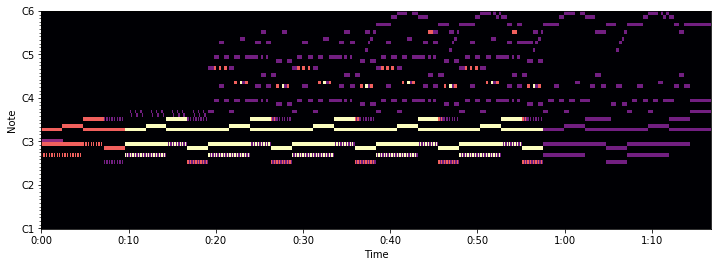

In [11]:
plt.figure(figsize=(12, 4))
plot_piano_roll(m, 24, 84)

In [13]:
# Synthesis frequency
fs = 16000
IPython.display.Audio(m.synthesize(fs=fs), rate=fs)
# Sounds like sine waves...

In [14]:
IPython.display.Audio(m.fluidsynth(fs=fs), rate=fs)

### As a pianoroll Multitrack

In [15]:
track = m.tracks[3]
track.pianoroll

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

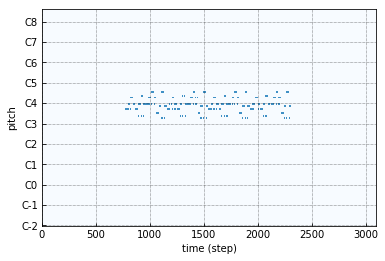

In [16]:
fig, ax = track.plot()
plt.show()

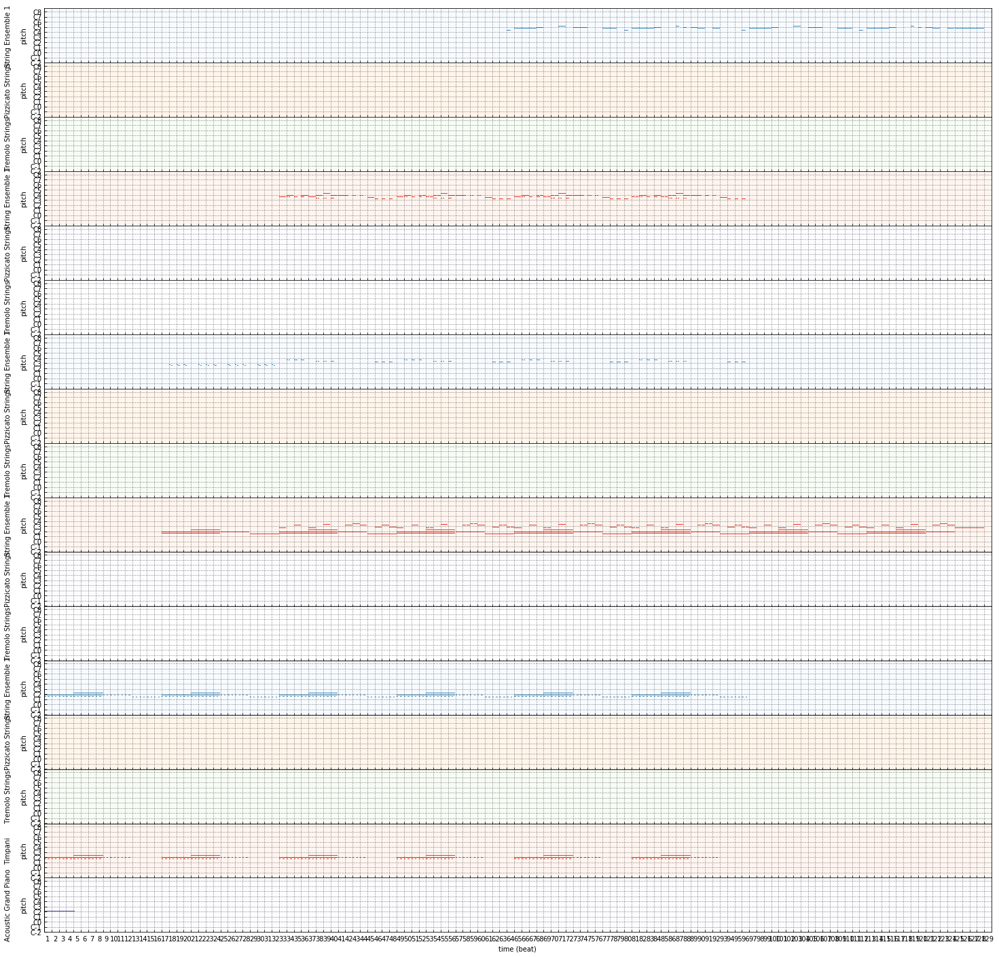

In [17]:
fig, axs = m.plot()
fig.set_size_inches(25,25)
plt.show()

### As a MidiArray

In [18]:
#MidiArray is always normalized to values between 0 and 1 by dividing by 128 the max vel value for midi format
m.array[np.nonzero(m.array)]

array([0.63, 0.63, 0.63, ..., 0.63, 0.63, 0.63], dtype=float16)

In [19]:
m.tracks_map[3]

{'is_drum': False, 'name': 'String Ensemble 1', 'program': 48, 'used': True}

In [20]:
m.tracks_map[3]["name"]="NEW STRINGS"
m.instruments

[Instrument(program=48, is_drum=False, name="String Ensemble 1"),
 Instrument(program=45, is_drum=False, name="Pizzicato Strings"),
 Instrument(program=44, is_drum=False, name="Tremolo Strings"),
 Instrument(program=48, is_drum=False, name="NEW STRINGS"),
 Instrument(program=45, is_drum=False, name="Pizzicato Strings"),
 Instrument(program=44, is_drum=False, name="Tremolo Strings"),
 Instrument(program=48, is_drum=False, name="String Ensemble 1"),
 Instrument(program=45, is_drum=False, name="Pizzicato Strings"),
 Instrument(program=44, is_drum=False, name="Tremolo Strings"),
 Instrument(program=48, is_drum=False, name="String Ensemble 1"),
 Instrument(program=45, is_drum=False, name="Pizzicato Strings"),
 Instrument(program=44, is_drum=False, name="Tremolo Strings"),
 Instrument(program=48, is_drum=False, name="String Ensemble 1"),
 Instrument(program=45, is_drum=False, name="Pizzicato Strings"),
 Instrument(program=44, is_drum=False, name="Tremolo Strings"),
 Instrument(program=47, is

### As a MidiFile

In [21]:
m.print_tracks()

=== Track 0
<meta message set_tempo tempo=500000 time=0>
<meta message time_signature numerator=4 denominator=4 clocks_per_click=24 notated_32nd_notes_per_beat=8 time=0>
<meta message end_of_track time=1>
=== Track 1
<meta message track_name name='String Ensemble 1' time=0>
<message program_change channel=0 program=48 time=0>
<message note_on channel=0 note=73 velocity=80 time=1488>
<message note_on channel=0 note=73 velocity=0 time=12>
<message note_on channel=0 note=75 velocity=80 time=0>
<message note_on channel=0 note=75 velocity=0 time=12>
<message note_on channel=0 note=76 velocity=80 time=0>
<message note_on channel=0 note=76 velocity=0 time=12>
<message note_on channel=0 note=78 velocity=80 time=0>
<message note_on channel=0 note=78 velocity=0 time=12>
<message note_on channel=0 note=80 velocity=80 time=0>
<message note_on channel=0 note=80 velocity=0 time=72>
<message note_on channel=0 note=82 velocity=80 time=0>
<message note_on channel=0 note=82 velocity=0 time=24>
<message 

<message note_on channel=13 note=47 velocity=0 time=6>
<message note_on channel=13 note=47 velocity=80 time=6>
<message note_on channel=13 note=47 velocity=0 time=6>
<message note_on channel=13 note=51 velocity=0 time=5>
<message note_on channel=13 note=42 velocity=80 time=1>
<message note_on channel=13 note=46 velocity=80 time=0>
<message note_on channel=13 note=51 velocity=80 time=0>
<message note_on channel=13 note=54 velocity=0 time=0>
<message note_on channel=13 note=42 velocity=0 time=6>
<message note_on channel=13 note=42 velocity=80 time=6>
<message note_on channel=13 note=42 velocity=0 time=6>
<message note_on channel=13 note=42 velocity=80 time=6>
<message note_on channel=13 note=42 velocity=0 time=6>
<message note_on channel=13 note=42 velocity=80 time=6>
<message note_on channel=13 note=42 velocity=0 time=6>
<message note_on channel=13 note=42 velocity=80 time=6>
<message note_on channel=13 note=42 velocity=0 time=6>
<message note_on channel=13 note=42 velocity=80 time=6>
<

In [22]:
m.type

1

In [23]:
#total playback time in seconds 
m.length

64.02083333333333

## Pre Processing

#### Orchestrating

In [24]:
#Programs Map maps the programs to a destination track
programs_map = {('woods',False): 0,
                ('brass',False): 1,
                ('percussion',True): 2,
                ('timpani',False): 3,
                ('chromatic_percussion',False): 4,
                ('voices', False): 5,
                ('guitars',False): 6,
                ('basses',False): 6,
                ('strings',False): 6,
                ('keyboards',False): 7}

#Tracks_map is the configuration for the new orchestrated tracks
tracks_map = [{'program':71,'is_drum':False,"name":"woods"}, #woods
               {'program':60,'is_drum':False,"name":"brass"}, #brass
               {'program':0,'is_drum':True,"name":"percussion"},  #percussion
               {'program':47,'is_drum':False,"name":"timpani"}, #timpani
               {'program':14,'is_drum':False,"name":"tubular bells"}, #tubular bells
               {'program':52,'is_drum':False,"name":"voices"}, #voices
               {'program':48,'is_drum':False,"name":"strings"}, #strings
               {'program':1,'is_drum':False,"name":"piano"}] #piano


In [5]:
m = Gmidi(path+"midifile.mid")
m.orchestrate(gmidi.pyormidict.translate(programs_map),tracks_map)
m.tracks_map = tracks_map
m.to_jpg(path+"midifile.jpg")

ValueError: If src is a path it should point to a file

In [26]:
m.to(path+"orchestrate.mid")

'samples/orchestrate.mid'

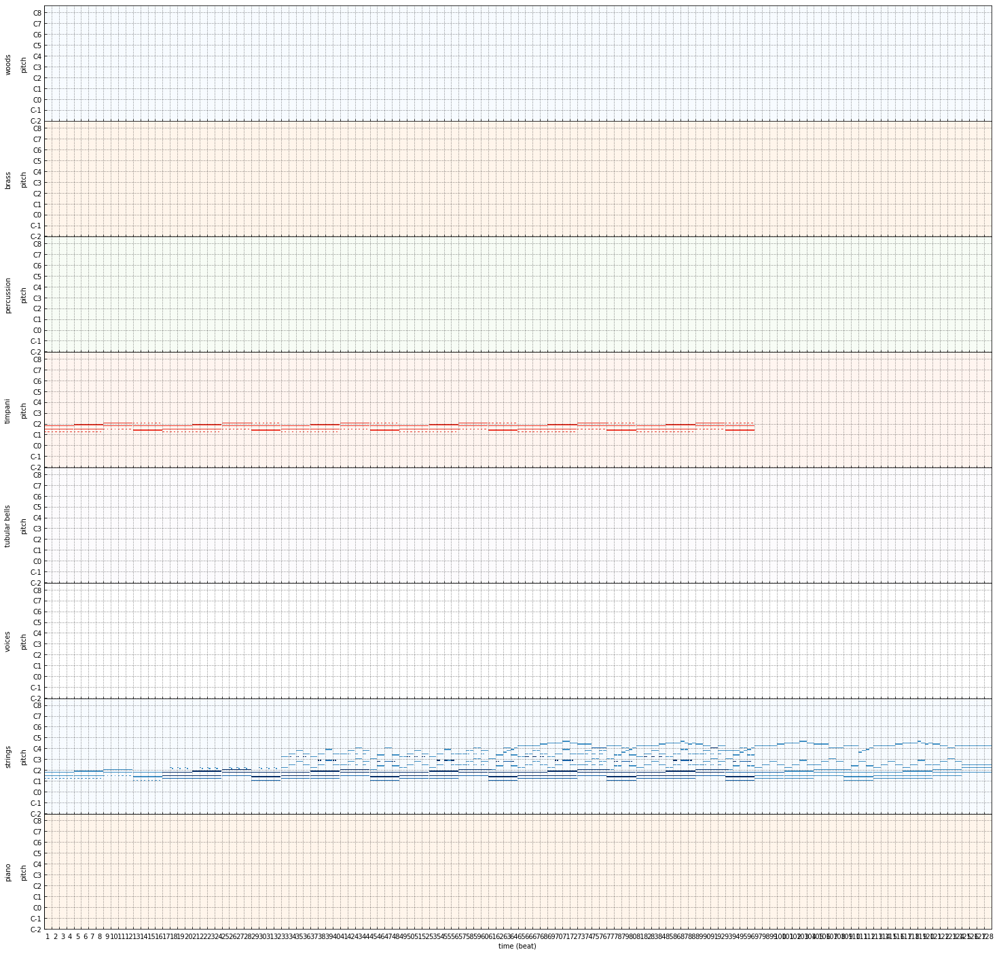

In [27]:
fig, axs = m.plot()
fig.set_size_inches(25,25)
plt.show()

#### Transposing

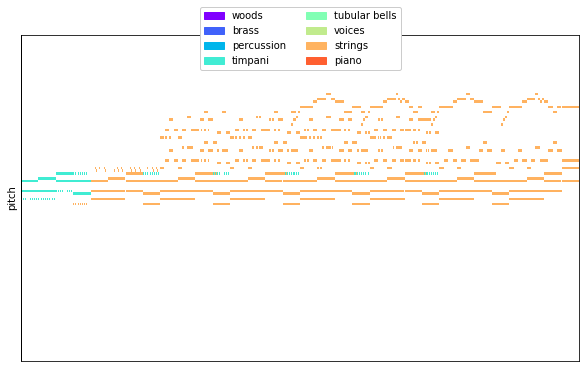

In [28]:
semitones = 24 #two octaves up
m.transpose(semitones)
m.to_jpg(path+"midifile.jpg")

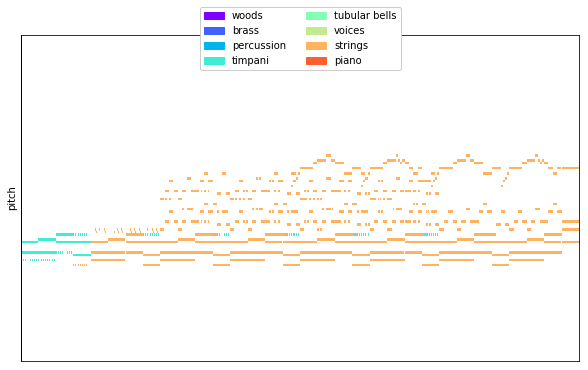

In [29]:
semitones = -24 #two octaves up
m.transpose(semitones)
m.to_jpg(path+"midifile.jpg")

#### Procesing in one step

In [30]:
"""Given a path it returns a np.array(12,-1,ticks,pitch,len(t_to_i)) with pre-processed and augmented data
- unifies orchestration
- choped in blocks
- augmented by transposing from transpose[0] semitones to transpose[1] semitones (default from one dim fifth bellow to one perfect fourth above
- slicing the wanted pitches
- normalizing the velocities between 0 and 1
"""

array = Gmidi.process(path+"midifile.mid",
                  i_to_t=programs_map,
                  t_to_i=tracks_map,
                  ticks=4*24*4,
                  min_pitch=0,
                  max_pitch=128,
                  min_vel=0,
                  max_vel=90,
                  transpose=(-6,6))

In [31]:
#Shape -> (Transpositions, Blocks, Ticks, Pitches, Tracks)
array.shape

(12, 8, 384, 128, 8)

## Sparse Array Operations

In [32]:
gmidi.utils.sparray.save(path+"sparray.npz",array)

In [33]:
loaded_a = gmidi.utils.sparray.load(path+"sparray.npz")

In [34]:
loaded_a1 = np.reshape(loaded_a[0],(-1,128,8))
print(loaded_a1.shape)
print(loaded_a1[np.nonzero(loaded_a1)])

(3072, 128, 8)
[0.62988281 0.62988281 0.62988281 ... 0.62988281 0.62988281 0.62988281]


In [35]:
m2 = Gmidi(MidiArray(array = loaded_a1[...,2:],tracks_map = tracks_map[:-2]))

In [ ]:
m2.to(path+"recmidifile.mid")

In [37]:
#plot_piano_roll(m, 0, 84)
m2.tracks
#m2.get_piano_roll(100)#[start_pitch:end_pitch]

[Track(pianoroll=array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8), program=71, is_drum=False, name=woods),
 Track(pianoroll=array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8), program=60, is_drum=False, name=brass),
 Track(pianoroll=array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8), program=0, is_drum=True, name=percussion),
 Track(pianoroll=array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 

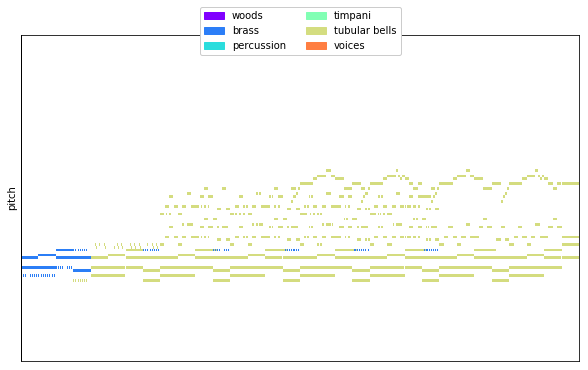

In [38]:
m2.instruments
m2.to_jpg(path+"midifile.jpg")

In [39]:
IPython.display.Audio(m2.fluidsynth(fs=fs), rate=fs)

### Evaluating

In [8]:
fun = gmidi.utils.metrics.average_volume
ev = gmidi.utils.metrics.metric(fun,[1,1,1,1,1,0],"Strings Average Volume")


In [6]:
array = gmidi.utils.sparray.load(path+"sparray.npz")

In [9]:
for i in array:
    ev.add(i)

In [11]:
ev.c.table()

,Global,Seq Size,Center,Standard Amplitude,Min,25%,50%,75%,Max,Minimizer,Maximizer,Var Center,Var Standard Amplitude,Var Min,Var 25%,Var 50%,Var 75%,Var Max,Var Minimizer,Var Maximizer
0,1.533532,6.0,1.533395,0.033594,1.484724,1.518173,1.528888,1.560493,1.57224,0.25,0.625,0.008411,0.033482,-0.03031,-0.015153,0.001645,0.042866,0.043006,0.125,0.375
1,1.533532,6.0,1.533395,0.033594,1.484724,1.518173,1.528888,1.560493,1.57224,0.25,0.625,0.008411,0.033482,-0.03031,-0.015153,0.001645,0.042866,0.043006,0.125,0.375
2,1.533532,6.0,1.533395,0.033594,1.484724,1.518173,1.528888,1.560493,1.57224,0.25,0.625,0.008411,0.033482,-0.03031,-0.015153,0.001645,0.042866,0.043006,0.125,0.375
3,1.533532,6.0,1.533395,0.033594,1.484724,1.518173,1.528888,1.560493,1.57224,0.25,0.625,0.008411,0.033482,-0.03031,-0.015153,0.001645,0.042866,0.043006,0.125,0.375
4,1.533532,6.0,1.533395,0.033594,1.484724,1.518173,1.528888,1.560493,1.57224,0.25,0.625,0.008411,0.033482,-0.03031,-0.015153,0.001645,0.042866,0.043006,0.125,0.375
5,1.533532,6.0,1.533395,0.033594,1.484724,1.518173,1.528888,1.560493,1.57224,0.25,0.625,0.008411,0.033482,-0.03031,-0.015153,0.001645,0.042866,0.043006,0.125,0.375
6,1.533532,6.0,1.533395,0.033594,1.484724,1.518173,1.528888,1.560493,1.57224,0.25,0.625,0.008411,0.033482,-0.03031,-0.015153,0.001645,0.042866,0.043006,0.125,0.375
7,1.533532,6.0,1.533395,0.033594,1.484724,1.518173,1.528888,1.560493,1.57224,0.25,0.625,0.008411,0.033482,-0.03031,-0.015153,0.001645,0.042866,0.043006,0.125,0.375
8,1.533532,6.0,1.533395,0.033594,1.484724,1.518173,1.528888,1.560493,1.57224,0.25,0.625,0.008411,0.033482,-0.03031,-0.015153,0.001645,0.042866,0.043006,0.125,0.375
9,1.533532,6.0,1.533395,0.033594,1.484724,1.518173,1.528888,1.560493,1.57224,0.25,0.625,0.008411,0.033482,-0.03031,-0.015153,0.001645,0.042866,0.043006,0.125,0.375


In [12]:
ev.r.table()

,X,Y
0,0.000000,1.530187
1,0.142857,1.515034
2,0.285714,1.484724
3,0.428571,1.527590
4,0.571429,1.570596
5,0.714286,1.572240
6,0.000000,1.530187
7,0.142857,1.515034
8,0.285714,1.484724
9,0.428571,1.527590


In [10]:
ev.u.table()

,0.0,0.143,0.286,0.429,0.571,0.714,0.857,1.0
0,1.530187,1.515034,1.484724,1.52759,1.570596,1.57224,NaN,NaN
1,1.530187,1.515034,1.484724,1.52759,1.570596,1.57224,NaN,NaN
2,1.530187,1.515034,1.484724,1.52759,1.570596,1.57224,NaN,NaN
3,1.530187,1.515034,1.484724,1.52759,1.570596,1.57224,NaN,NaN
4,1.530187,1.515034,1.484724,1.52759,1.570596,1.57224,NaN,NaN
5,1.530187,1.515034,1.484724,1.52759,1.570596,1.57224,NaN,NaN
6,1.530187,1.515034,1.484724,1.52759,1.570596,1.57224,NaN,NaN
7,1.530187,1.515034,1.484724,1.52759,1.570596,1.57224,NaN,NaN
8,1.530187,1.515034,1.484724,1.52759,1.570596,1.57224,NaN,NaN
9,1.530187,1.515034,1.484724,1.52759,1.570596,1.57224,NaN,NaN


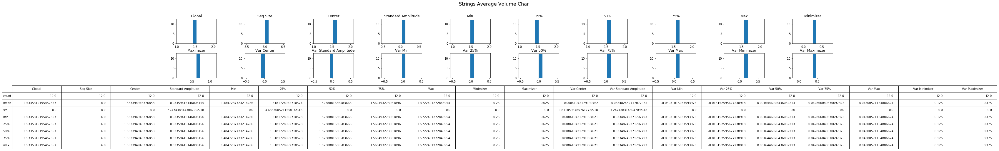

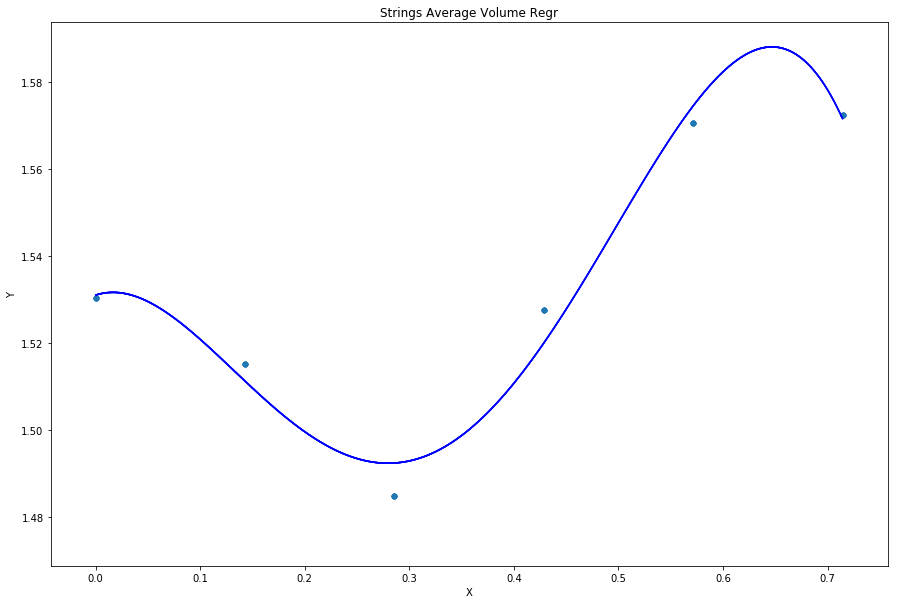

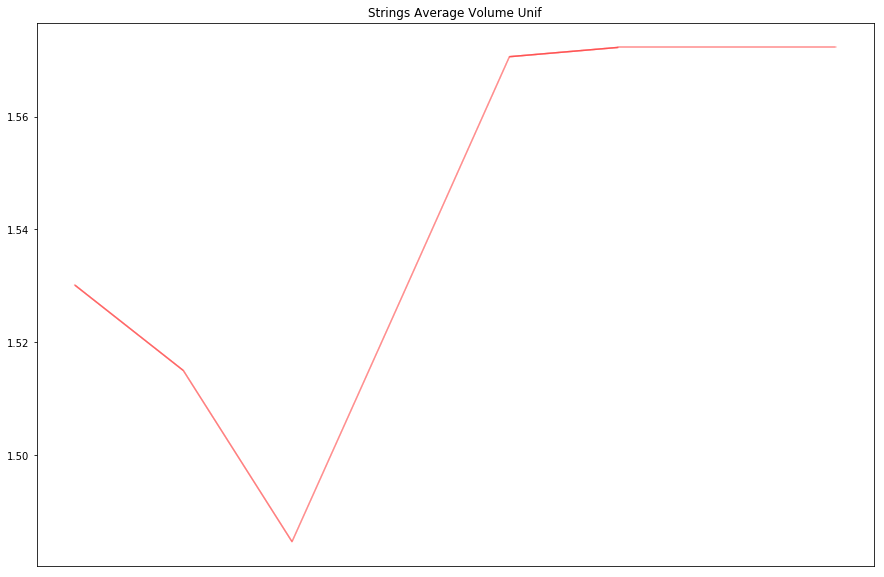

In [6]:
ev.present()

MemoryError: In RendererAgg: Out of memory

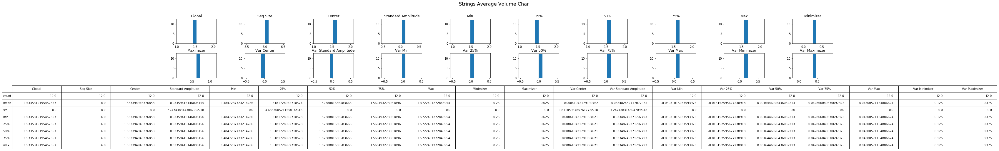

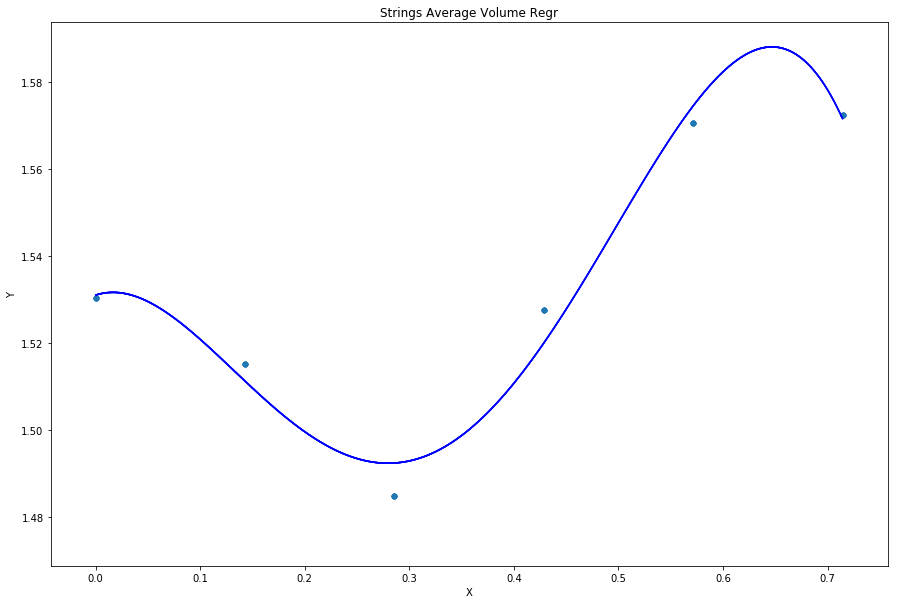

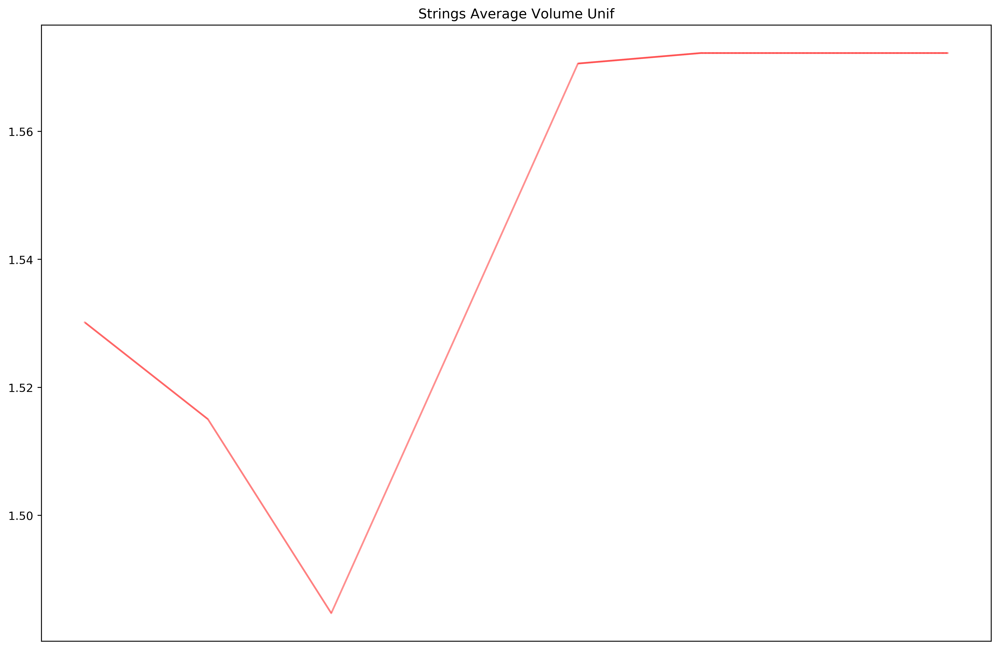

In [13]:
ev.to_dir()